# 특성 선택 - 상관계수와 VIF를 파악해서 직접 제거

## 집값에 대한 회귀분석

In [2]:
#데이터 불러오기
import pandas as pd

%matplotlib inline

df = pd.read_csv('./data/house_prices.csv')
#데이터 확인
print(df.head())
print()

#데이터 정보 파악
print(df.info())
print()

house_id neighborhood  area  bedrooms  bathrooms      style    price
0      1112            B  1188         3          2      ranch   598291
1       491            B  3512         5          3  victorian  1744259
2      5952            B  1134         3          2      ranch   571669
3      3525            A  1940         4          2      ranch   493675
4      5108            B  2208         6          4  victorian  1101539

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6028 entries, 0 to 6027
Data columns (total 7 columns):
house_id        6028 non-null int64
neighborhood    6028 non-null object
area            6028 non-null int64
bedrooms        6028 non-null int64
bathrooms       6028 non-null int64
style           6028 non-null object
price           6028 non-null int64
dtypes: int64(5), object(2)
memory usage: 329.8+ KB
None



In [3]:
#선형 회귀 분석 수행 - bedrooms의 
import statsmodels.api as sm
df['intercept'] = 1
lm = sm.OLS(df['price'], df[['intercept', 'bedrooms', 'bathrooms', 'area']])
results = lm.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.678
Method:                 Least Squares   F-statistic:                     4230.
Date:                Wed, 18 Mar 2020   Prob (F-statistic):               0.00
Time:                        14:32:39   Log-Likelihood:                -84517.
No. Observations:                6028   AIC:                         1.690e+05
Df Residuals:                    6024   BIC:                         1.691e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1.007e+04   1.04e+04      0.972      0.331   -1.02e+04    3.04e+04
bedrooms   -2925.8063   1.03e+04     -0.285      0.775    -2.3e+04    1.72e+04
bathrooms   7345.3917   1.43e+04      0.515      0.607   -2.06e+04    3.53e+04
area         345.9110      7.227     47.863      0.000     331.743     360.079
==============================================================================
Omnibus:                      367.658   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              350.116
Skew:                           0.536   Prob(JB):                     9.40e-77
Kurtosis:                       2.503   Cond. No.                     1.16e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.16e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [4]:
#상관계수 확인
import numpy as np
print(df[['area', 'bedrooms', 'bathrooms']].corr())

area  bedrooms  bathrooms
area       1.000000  0.901623   0.891481
bedrooms   0.901623  1.000000   0.972768
bathrooms  0.891481  0.972768   1.000000


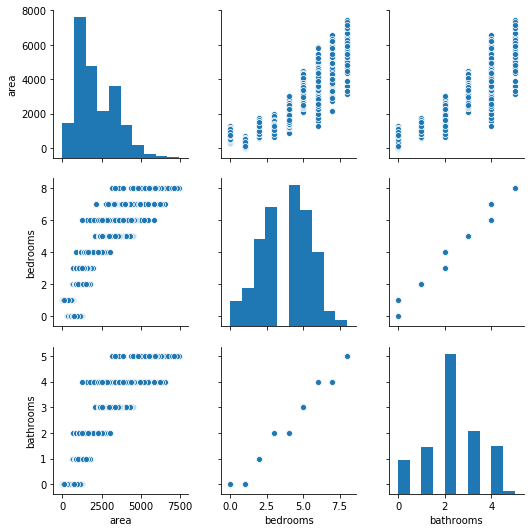

In [5]:
#산점도 그리기
import seaborn as sns
%matplotlib inline
sns.pairplot(df[['area', 'bedrooms', 'bathrooms']])

In [6]:
#VIF(분산팽창요인) 확인
from patsy import dmatrices
import statsmodels.api as sm;
from statsmodels.stats.outliers_influence import variance_inflation_factor

result1, result2 = dmatrices('price ~ area + bedrooms + bathrooms', df, return_type = 'dataframe') 
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(result2.values, i) for i in range(result2.shape[1])]
vif["features"] = result2.columns 
print(vif)

VIF Factor   features
0    7.327102  Intercept
1    5.458190       area
2   20.854484   bedrooms
3   19.006851  bathrooms


In [7]:
#bethrooms를 제외하고 분산 팽창 요인을 확인하고 선형 회귀 분석 수행
result1, result2 = dmatrices('price ~ area + bedrooms', df, return_type = 'dataframe') 
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(result2.values, i) for i in range(result2.shape[1])]
vif["features"] = result2.columns 
print(vif)
print('\n')

lm = sm.OLS(df['price'], df[['intercept', 'bedrooms', 'area']])
results = lm.fit()
results.summary()

VIF Factor   features
0    6.063895  Intercept
1    5.345400       area
2    5.345400   bedrooms




<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.678
Method:                 Least Squares   F-statistic:                     6345.
Date:                Wed, 18 Mar 2020   Prob (F-statistic):               0.00
Time:                        14:32:47   Log-Likelihood:                -84517.
No. Observations:                6028   AIC:                         1.690e+05
Df Residuals:                    6025   BIC:                         1.691e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   7857.4509   9425.288      0.834      0.405   -1.06e+04    2.63e+04
bedrooms    1626.8306   5191.702      0.313      0.754   -8550.763    1.18e+04
area         346.4458      7.152     48.443      0.000     332.426     360.466
==============================================================================
Omnibus:                      368.146   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              350.224
Skew:                           0.535   Prob(JB):                     8.91e-77
Kurtosis:                       2.502   Cond. No.                     6.45e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.45e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## 와인 데이터의 분류 분석

In [8]:
#데이터 가져오기
import numpy as np
import pandas as pd
#df_wine = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine/wine.data', header=None)

# UCI 머신 러닝 저장소에서 Wine 데이터셋을 다운로드할 수 없을 때
# 다음 주석을 해제하고 로컬 경로에서 데이터셋을 적재하세요.

df_wine = pd.read_csv('./data/wine.data', header=None)

df_wine.columns = ['Classlabel', 'Alcohol', 'Malicacid', 'Ash',
                   'Alcalinityofash', 'Magnesium', 'Totalphenols',
                   'Flavanoids', 'Nonflavanoidphenols', 'Proanthocyanins',
                   'Colorintensity', 'Hue', 'dilutedwines',
                   'Proline']
#데이터 확인
print(df_wine.head())

#종속 변수 확인
print('클래스 레이블', np.unique(df_wine['Classlabel']))

Classlabel  Alcohol  Malicacid   Ash  Alcalinityofash  Magnesium  \
0           1    14.23       1.71  2.43             15.6        127   
1           1    13.20       1.78  2.14             11.2        100   
2           1    13.16       2.36  2.67             18.6        101   
3           1    14.37       1.95  2.50             16.8        113   
4           1    13.24       2.59  2.87             21.0        118   

   Totalphenols  Flavanoids  Nonflavanoidphenols  Proanthocyanins  \
0          2.80        3.06                 0.28             2.29   
1          2.65        2.76                 0.26             1.28   
2          2.80        3.24                 0.30             2.81   
3          3.85        3.49                 0.24             2.18   
4          2.80        2.69                 0.39             1.82   

   Colorintensity   Hue  dilutedwines  Proline  
0            5.64  1.04          3.92     1065  
1            4.38  1.05          3.40     1050  
2            5

In [9]:
#데이터 개수 및 속성 개수 파악
print(df_wine.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
Classlabel             178 non-null int64
Alcohol                178 non-null float64
Malicacid              178 non-null float64
Ash                    178 non-null float64
Alcalinityofash        178 non-null float64
Magnesium              178 non-null int64
Totalphenols           178 non-null float64
Flavanoids             178 non-null float64
Nonflavanoidphenols    178 non-null float64
Proanthocyanins        178 non-null float64
Colorintensity         178 non-null float64
Hue                    178 non-null float64
dilutedwines           178 non-null float64
Proline                178 non-null int64
dtypes: float64(11), int64(3)
memory usage: 19.6 KB
None


In [10]:
#설명 변수들의 상관계수 파악
y = df_wine['Classlabel']
X = df_wine[['Alcohol', 'Malicacid', 'Ash',
                   'Alcalinityofash', 'Magnesium', 'Totalphenols',
                   'Flavanoids', 'Nonflavanoidphenols', 'Proanthocyanins',
                   'Colorintensity', 'Hue', 'dilutedwines',
                   'Proline']]
print(X.corr())

Alcohol  Malicacid       Ash  Alcalinityofash  \
Alcohol              1.000000   0.094397  0.211545        -0.310235   
Malicacid            0.094397   1.000000  0.164045         0.288500   
Ash                  0.211545   0.164045  1.000000         0.443367   
Alcalinityofash     -0.310235   0.288500  0.443367         1.000000   
Magnesium            0.270798  -0.054575  0.286587        -0.083333   
Totalphenols         0.289101  -0.335167  0.128980        -0.321113   
Flavanoids           0.236815  -0.411007  0.115077        -0.351370   
Nonflavanoidphenols -0.155929   0.292977  0.186230         0.361922   
Proanthocyanins      0.136698  -0.220746  0.009652        -0.197327   
Colorintensity       0.546364   0.248985  0.258887         0.018732   
Hue                 -0.071747  -0.561296 -0.074667        -0.273955   
dilutedwines         0.072343  -0.368710  0.003911        -0.276769   
Proline              0.643720  -0.192011  0.223626        -0.440597   

                     Magnes

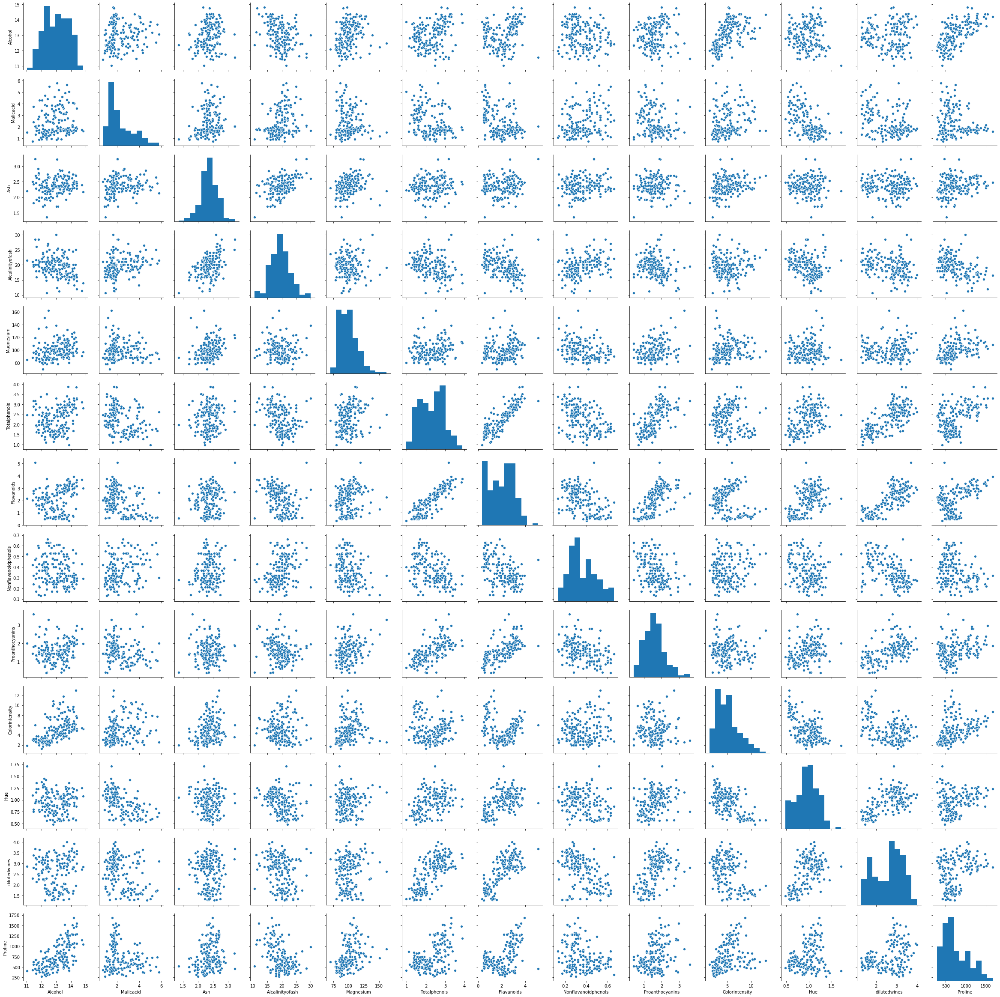

In [11]:
#산점도 그리기
import seaborn as sns
%matplotlib inline
sns.pairplot(X)

In [12]:
#vif 파악
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor
result1, result2 = dmatrices('Classlabel ~ Alcohol + Malicacid + Ash + Alcalinityofash + Magnesium + Totalphenols + Flavanoids + Nonflavanoidphenols + Proanthocyanins + Colorintensity + Hue + dilutedwines + Proline' , df_wine, return_type = 'dataframe')

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(result2.values, i) for i in range(result2.shape[1])]
vif["features"] = result2.columns 
print(vif)

VIF Factor             features
0   680.485185            Intercept
1     2.460372              Alcohol
2     1.656647            Malicacid
3     2.185448                  Ash
4     2.238732      Alcalinityofash
5     1.417855            Magnesium
6     4.334519         Totalphenols
7     7.029350           Flavanoids
8     1.796380  Nonflavanoidphenols
9     1.975683      Proanthocyanins
10    3.026304       Colorintensity
11    2.551447                  Hue
12    3.785473         dilutedwines
13    2.823849              Proline


In [13]:
# 설명 변수 데이터를 정규화(normalization)
from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)

# train data 와 test data로 구분(7:3 비율)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10) 

# sklearn 라이브러리에서 SVM 분류 모형 가져오기
from sklearn import svm

# 모형 객체 생성 (kernel='rbf' 적용)
svm_model = svm.SVC(kernel='linear')

# train data를 가지고 모형 학습
svm_model.fit(X_train, y_train)   

# test data를 가지고 y_hat을 예측 (분류) 
y_hat = svm_model.predict(X_test)

print(y_hat[0:10])
print(y_test.values[0:10])
print('\n')

# 모형 성능 평가 - Confusion Matrix 계산
from sklearn import metrics 
svm_matrix = metrics.confusion_matrix(y_test, y_hat)  
print(svm_matrix)
print('\n')

# 모형 성능 평가 - 평가지표 계산
svm_report = metrics.classification_report(y_test, y_hat)            
print(svm_report)

[2 2 1 2 1 2 2 1 3 1]
[2 2 1 2 1 2 2 1 3 1]


[[15  0  0]
 [ 0 24  3]
 [ 0  0 12]]


              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       1.00      0.89      0.94        27
           3       0.80      1.00      0.89        12

    accuracy                           0.94        54
   macro avg       0.93      0.96      0.94        54
weighted avg       0.96      0.94      0.95        54



In [14]:
y = df_wine['Classlabel']
X = df_wine[['Alcohol', 'Malicacid', 'Ash',
                   'Alcalinityofash', 'Magnesium', 'Totalphenols',
                    'Nonflavanoidphenols', 'Proanthocyanins',
                   'Colorintensity', 'Hue', 'dilutedwines',
                   'Proline']]
# 설명 변수 데이터를 정규화(normalization)
from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)

# train data 와 test data로 구분(7:3 비율)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10) 

# sklearn 라이브러리에서 SVM 분류 모형 가져오기
from sklearn import svm

# 모형 객체 생성 (kernel='rbf' 적용)
svm_model = svm.SVC(kernel='linear')

# train data를 가지고 모형 학습
svm_model.fit(X_train, y_train)   

# test data를 가지고 y_hat을 예측 (분류) 
y_hat = svm_model.predict(X_test)

print(y_hat[0:10])
print(y_test.values[0:10])
print('\n')

# 모형 성능 평가 - Confusion Matrix 계산
from sklearn import metrics 
svm_matrix = metrics.confusion_matrix(y_test, y_hat)  
print(svm_matrix)
print('\n')

# 모형 성능 평가 - 평가지표 계산
svm_report = metrics.classification_report(y_test, y_hat)            
print(svm_report)

[2 2 1 2 1 2 2 1 3 1]
[2 2 1 2 1 2 2 1 3 1]


[[15  0  0]
 [ 1 23  3]
 [ 0  0 12]]


              precision    recall  f1-score   support

           1       0.94      1.00      0.97        15
           2       1.00      0.85      0.92        27
           3       0.80      1.00      0.89        12

    accuracy                           0.93        54
   macro avg       0.91      0.95      0.93        54
weighted avg       0.94      0.93      0.93        54



# 그라이디언트 부스팅을 이용해서 특성 중요도를 파악한 후 제거

## 분류할 데이터 만들기

In [15]:
#데이터 가져오기
import numpy as np
import pandas as pd
#df_wine = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine/wine.data', header=None)

# UCI 머신 러닝 저장소에서 Wine 데이터셋을 다운로드할 수 없을 때
# 다음 주석을 해제하고 로컬 경로에서 데이터셋을 적재하세요.

df_wine = pd.read_csv('./data/wine.data', header=None)

df_wine.columns = ['Classlabel', 'Alcohol', 'Malicacid', 'Ash',
                   'Alcalinityofash', 'Magnesium', 'Totalphenols',
                   'Flavanoids', 'Nonflavanoidphenols', 'Proanthocyanins',
                   'Colorintensity', 'Hue', 'dilutedwines',
                   'Proline']

y = df_wine['Classlabel'].values
X = df_wine[['Alcohol', 'Malicacid', 'Ash',
                   'Alcalinityofash', 'Magnesium', 'Totalphenols',
                   'Flavanoids', 'Nonflavanoidphenols', 'Proanthocyanins',
                   'Colorintensity', 'Hue', 'dilutedwines',
                   'Proline']].values

# 설명 변수 데이터를 정규화(normalization)
from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)

# train data 와 test data로 구분(7:3 비율)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10) 

## 특성 전체를 이용해서 그라디언트 부스팅 수행

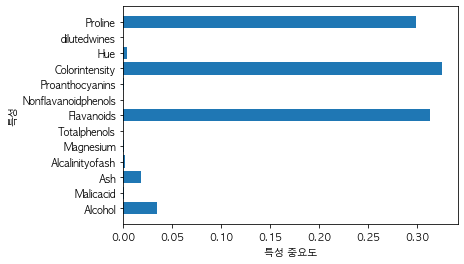

[2 2 1 2 1 2 2 1 3 1]
[2 2 1 2 1 2 2 1 3 1]


[[14  1  0]
 [ 0 26  1]
 [ 0  1 11]]


              precision    recall  f1-score   support

           1       1.00      0.93      0.97        15
           2       0.93      0.96      0.95        27
           3       0.92      0.92      0.92        12

    accuracy                           0.94        54
   macro avg       0.95      0.94      0.94        54
weighted avg       0.95      0.94      0.94        54



In [16]:
from sklearn.ensemble import GradientBoostingClassifier

gbrt = GradientBoostingClassifier(random_state=0, max_depth=3)
gbrt.fit(X_train, y_train)

# test data를 가지고 y_hat을 예측 (분류) 
y_hat = gbrt.predict(X_test) 

#특성 중요도 파악
import numpy as np
import matplotlib.pyplot as plt
import platform
from matplotlib import font_manager, rc

#매킨토시의 경우
if platform.system() == 'Darwin':
    rc('font', family='AppleGothic')
#윈도우의 경우
elif platform.system() == 'Windows':
    font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)

n_features = X.data.shape[1]
plt.barh(np.arange(n_features), gbrt.feature_importances_, align='center')
plt.yticks(np.arange(n_features), ['Alcohol', 'Malicacid', 'Ash',
                   'Alcalinityofash', 'Magnesium', 'Totalphenols',
                   'Flavanoids', 'Nonflavanoidphenols', 'Proanthocyanins',
                   'Colorintensity', 'Hue', 'dilutedwines',
                   'Proline'])
plt.xlabel("특성 중요도")
plt.ylabel("특성")
plt.ylim(-1, n_features)
plt.show()

#성능 평가
# test data를 가지고 y_hat을 예측 (분류) 
y_hat = gbrt.predict(X_test) 
print(y_hat[0:10])
print(y_test[0:10])
print('\n')
# 모형 성능 평가 - Confusion Matrix 계산
from sklearn import metrics 
tree_matrix = metrics.confusion_matrix(y_test, y_hat)  
print(tree_matrix)
print('\n')

# 모형 성능 평가 - 평가지표 계산
tree_report = metrics.classification_report(y_test, y_hat)            
print(tree_report)

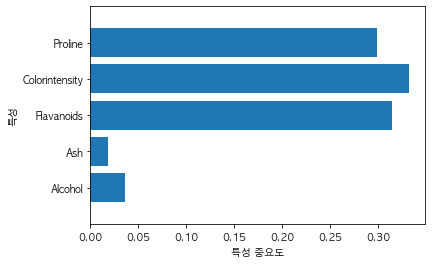

[2 2 1 2 1 2 2 1 3 1]
[2 2 1 2 1 2 2 1 3 1]


[[14  1  0]
 [ 0 26  1]
 [ 0  1 11]]


              precision    recall  f1-score   support

           1       1.00      0.93      0.97        15
           2       0.93      0.96      0.95        27
           3       0.92      0.92      0.92        12

    accuracy                           0.94        54
   macro avg       0.95      0.94      0.94        54
weighted avg       0.95      0.94      0.94        54



In [17]:
y = df_wine['Classlabel'].values
#특성 중요도가 낮은 특성을 제거하고 데이터 만들기
X = df_wine[['Alcohol','Ash','Flavanoids','Colorintensity','Proline']].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10) 

gbrt = GradientBoostingClassifier(random_state=0, max_depth=3)
gbrt.fit(X_train, y_train)

# test data를 가지고 y_hat을 예측 (분류) 
y_hat = gbrt.predict(X_test) 

n_features = X.data.shape[1]
plt.barh(np.arange(n_features), gbrt.feature_importances_, align='center')
plt.yticks(np.arange(n_features),['Alcohol','Ash','Flavanoids','Colorintensity','Proline'])
plt.xlabel("특성 중요도")
plt.ylabel("특성")
plt.ylim(-1, n_features)
plt.show()

#성능 평가
# test data를 가지고 y_hat을 예측 (분류) 
y_hat = gbrt.predict(X_test) 
print(y_hat[0:10])
print(y_test[0:10])
print('\n')
# 모형 성능 평가 - Confusion Matrix 계산
from sklearn import metrics 
tree_matrix = metrics.confusion_matrix(y_test, y_hat)  
print(tree_matrix)
print('\n')

# 모형 성능 평가 - 평가지표 계산
tree_report = metrics.classification_report(y_test, y_hat)            
print(tree_report)

# Scikit-Learn 에서의 PCA

In [18]:
### 기본 라이브러리 불러오기
import pandas as pd
import seaborn as sns

# load_dataset 함수를 사용하여 데이터프레임으로 변환
#df = sns.load_dataset('titanic')

#데이터가 호출되지 않으면 아래 코드 수행
df = pd.read_csv('./data/titanic.csv')

# NaN값이 많은 deck 열을 삭제, embarked와 내용이 겹치는 embark_town 열을 삭제
rdf = df.drop(['deck', 'embark_town'], axis=1)  

# age 열에 나이 데이터가 없는 모든 행을 삭제 - age 열(891개 중 177개의 NaN 값)
rdf = rdf.dropna(subset=['age'], how='any', axis=0)  
# embarked 열의 NaN값을 승선도시 중에서 가장 많이 출현한 값으로 치환하기
most_freq = rdf['embarked'].value_counts(dropna=True).idxmax()   
rdf['embarked'].fillna(most_freq, inplace=True)

# 분석에 활용할 열(속성)을 선택 
ndf = rdf[['survived', 'pclass', 'sex', 'age', 'sibsp', 'parch', 'embarked']]

# 원핫인코딩 - 범주형 데이터를 모형이 인식할 수 있도록 숫자형으로 변환
onehot_sex = pd.get_dummies(ndf['sex'])
ndf = pd.concat([ndf, onehot_sex], axis=1)

onehot_embarked = pd.get_dummies(ndf['embarked'], prefix='town')
ndf = pd.concat([ndf, onehot_embarked], axis=1)

ndf.drop(['sex', 'embarked'], axis=1, inplace=True)

# 속성(변수) 선택
X=ndf[['pclass', 'age', 'sibsp', 'parch', 'female', 'male', 'town_C', 'town_Q', 'town_S']]  #독립 변수 X
y=ndf['survived']                      #종속 변수 Y

# 설명 변수 데이터를 정규화(normalization)
from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)

# train data 와 test data로 구분(7:3 비율)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10) 

In [19]:
from sklearn.decomposition import PCA

#성분을 3개로 만들기
pca = PCA(n_components=5)
pca.fit(X_train)
#각 성분의 explained_variance_ratio_ 구하기
#explained_variance_ratio_: 각 성분에 포함된 데이터의 분산의 크기
print('explained variance ratio :', pca.explained_variance_ratio_)

explained variance ratio : [0.26624939 0.21223428 0.17706288 0.12720388 0.09956669]


In [20]:
#주성분분석을 수행한 데이터 만들기
pca = PCA(n_components=1)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.fit_transform(X_test)

In [21]:
#주성분 분석 이전의 훈련 데이터를 이용해서 로지스틱 회귀 분석 수행
from sklearn.linear_model import LogisticRegression

#로지스틱 회귀 분석 객체를 생성
lr = LogisticRegression(random_state=1)
#데이터 훈련
lr.fit(X_train, y_train)

y_test_pred = lr.predict(X_test)

# 모형 성능 평가 - Confusion Matrix 계산
from sklearn import metrics 
svm_matrix = metrics.confusion_matrix(y_test, y_test_pred)  
print(svm_matrix)
print('\n')

# 모형 성능 평가 - 평가지표 계산
svm_report = metrics.classification_report(y_test, y_test_pred)            
print(svm_report)

[[109  16]
 [ 25  65]]


              precision    recall  f1-score   support

           0       0.81      0.87      0.84       125
           1       0.80      0.72      0.76        90

    accuracy                           0.81       215
   macro avg       0.81      0.80      0.80       215
weighted avg       0.81      0.81      0.81       215



In [22]:
#주성분 분석 후 훈련 데이터를 이용해서 로지스틱 회귀 분석 수행
lr = LogisticRegression(random_state=1)
#데이터 훈련
lr.fit(X_train_pca, y_train)

y_test_pred = lr.predict(X_test_pca)

svm_matrix = metrics.confusion_matrix(y_test, y_test_pred)  
print(svm_matrix)
print('\n')

# 모형 성능 평가 - 평가지표 계산
svm_report = metrics.classification_report(y_test, y_test_pred)            
print(svm_report)

[[102  23]
 [ 28  62]]


              precision    recall  f1-score   support

           0       0.78      0.82      0.80       125
           1       0.73      0.69      0.71        90

    accuracy                           0.76       215
   macro avg       0.76      0.75      0.75       215
weighted avg       0.76      0.76      0.76       215



## 메모리에 나누어서 올려서 PCA 수행하기 

In [23]:
import numpy as np
from sklearn.decomposition import IncrementalPCA

n_batches = 10
inc_pca = IncrementalPCA(n_components=1)

for batch_x in np.array_split(X_train, n_batches):
    print(".", end="") # not shown in the book
    inc_pca.partial_fit(batch_x)

X_reduced = inc_pca.transform(X_train)

..........